<a href="https://colab.research.google.com/github/vicperotti/BANA780/blob/main/Tweepy_with_tweet_cleaning_and_wordcloud.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [23]:
#this might help: https://medium.com/@adamichelllle/exploring-twitter-api-and-data-using-tweepy-pandas-and-matplotlib-part-1-2ac07fcc4717

import tweepy



In [24]:
#Variables that contains the user credentials to access Twitter API
ACCESS_TOKEN = "1626161-94Of8EP2oF7dmpdtRpA9EIxw2QGpKNPrON4sgTEjFU"
ACCESS_TOKEN_SECRET = "aO3Tx1LgBCK7kPsBWRyxPK1zy3vcgaCPK03cdfYHRbbLn"
API_KEY = "FK7twh68Wj3MU55EIAM82cRP0"
API_SECRET = "rRjROnrFDszY7h7aO7BkFWtx4j11JyaN6ZuHWeT1dKZz2TP8S9"

In [25]:
API_KEY = "zn6HV1Ck0a1WTWKdm2u8XyJA9"
API_SECRET = "kYzcna01v7DJcJrCTCJrHJwnLDrw9Oad6xk2GP43lsT7M3aXXx"
access_token = "1626161-jCakt5ReIFH1bfzUGZSWaUMNCHXEecsgKgwjgUXbua"
access_token_secret ="nD3fdvLdjBpLuXaFBxWCshwsRxHUwUmaPah4lD7gZ07Xl"

In [26]:
# assuming twitter_authentication.py contains each of the 4 oauth elements (1 per line)
#from twitter_authentication import API_KEY, API_SECRET, ACCESS_TOKEN, ACCESS_TOKEN_SECRET

auth = tweepy.OAuthHandler(API_KEY, API_SECRET)
#auth.set_access_token(ACCESS_TOKEN, ACCESS_TOKEN_SECRET)

In [27]:
api = tweepy.API(auth)



In [28]:
query = 'halftime -filter:retweets'
max_tweets = 2000
tweets_data = [status for status in tweepy.Cursor(api.search, q=query).items(max_tweets)]

In [29]:
tweets_data

[Status(_api=<tweepy.api.API object at 0x7f9b2348a490>, _json={'created_at': 'Mon Feb 14 16:57:42 +0000 2022', 'id': 1493268223483076618, 'id_str': '1493268223483076618', 'text': 'Am I the only one who didn’t give a shit about the halftime show? Life goes on lmaoo I had more fun', 'truncated': False, 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'metadata': {'iso_language_code': 'en', 'result_type': 'recent'}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 1333515103011024896, 'id_str': '1333515103011024896', 'name': '𝒬𝓊𝑒𝑒𝓃 𝑜𝒻 𝒫𝑒𝓉𝓉𝓎 𝒮𝓉𝓇𝑒𝑒𝓉', 'screen_name': 'scoliomama', 'location': '', 'description': 'Cannamama 🍃💨• NICU mama • Complex trauma survivor • Chronic pain • Severe Scoliosis • Avid traveller in another lifetime ✈️', 'url': N

In [30]:
import pandas as pd

In [31]:
#save it for later
import json
try:
    with open('halftime.json', 'a') as f:
        #json.dump(disneyplustweets, f)
        json.dump([status._json for status in tweets_data],f)
except BaseException as e:
    print("Error writing: %s" % str(e))

In [32]:
justthegoodstuff = [[tweet.created_at, tweet.text, tweet.retweet_count, tweet.favorite_count, tweet.user.screen_name, tweet.user.location] for tweet in tweets_data]

In [33]:
import pandas as pd
#and then make a dataframe
df = pd.DataFrame(justthegoodstuff, columns=['created_at','text','retweet_count','favorite_count','screenname','location'])

In [34]:
!pip install afinn


     |████████████████████████████████| 52 kB 940 kB/s 
  Created wheel for afinn: filename=afinn-0.1-py3-none-any.whl size=53447 sha256=3dca638df7434bfe542a010cdbfb534d5772ba32178f0f686d292bb9b330fb4a
  Stored in directory: /root/.cache/pip/wheels/9d/16/3a/9f0953027434eab5dadf3f33ab3298fa95afa8292fcf7aba75
Successfully built afinn


In [35]:
from afinn import Afinn
afinn = Afinn(emoticons=True)
df['sentiment'] = df.apply (lambda row: afinn.score(row['text']), axis=1)
df.keys()

Index(['created_at', 'text', 'retweet_count', 'favorite_count', 'screenname',
       'location', 'sentiment'],
      dtype='object')

In [36]:
df

,created_at,text,retweet_count,favorite_count,screenname,location,sentiment
0,2022-02-14 16:57:42,Am I the only one who didn’t give a shit about...,0,0,scoliomama,,0.0
1,2022-02-14 16:57:42,Snoop Dogg wore a FaZe Clan chain during the S...,0,0,TheBlakeGuidry,,3.0
2,2022-02-14 16:57:40,@TonyMarinaro Lady Gaga is my favorite super b...,0,0,FPnadon,"Montréal, Québec",7.0
3,2022-02-14 16:57:39,"That halftime show was up there with Prince, M...",0,0,TreyMCarter,KC/LA/ATL,1.0
4,2022-02-14 16:57:36,@dankat68 @JDCocchiarella It’s hilarious how l...,0,0,JustTrumpThing2,,-3.0
...,...,...,...,...,...,...,...
1995,2022-02-14 16:37:31,"A yes Monday, when my co workers will flood my...",0,0,ChadWes33264120,,-2.0
1996,2022-02-14 16:37:31,@Sugar_tits_420 I thought he knelt and put his...,0,1,rodneymartinSC,"Calhoun Falls, SC",-2.0
1997,2022-02-14 16:37:31,@michaeljknowles Agreed. Which do you think wa...,0,0,GideonSpevak,"Kingsville, Ontario",4.0
1998,2022-02-14 16:37:30,#Lame. That half time show was lame as all get...,0,0,calder_price,,-4.0


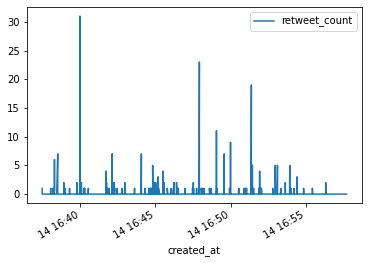

In [37]:
%matplotlib inline
df.plot.line(x='created_at',y='retweet_count')

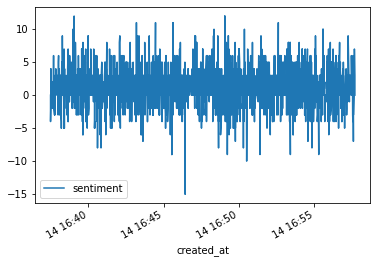

In [38]:
df.plot.line(x='created_at',y='sentiment')

In [39]:
import seaborn as sns

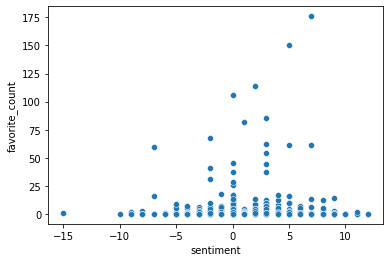

In [40]:
sns.scatterplot(data=df,x='sentiment',y='favorite_count')

##The following code from
##https://medium.com/codex/making-wordcloud-of-tweets-using-python-ca114b7a4ef4

In [41]:
import re
from bs4 import BeautifulSoup
from nltk.tokenize import WordPunctTokenizer
token = WordPunctTokenizer()

regex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags = re.UNICODE)
pattern = re.compile(r'(https?://)?(www\.)?(\w+\.)?(\w+)(\.\w+)(/.+)?')
re_list = ['@[A-Za-z0–9_]+', '#']
combined_re = re.compile( '|'.join( re_list) )

def cleaning_tweets(t):
    del_amp = BeautifulSoup(t, 'lxml')
    del_amp_text = del_amp.get_text()
    del_amp_text = re.sub(pattern, '', del_amp_text)
    del_link_mentions = re.sub(combined_re, '', del_amp_text)
    del_emoticons = re.sub(regex_pattern, '', del_link_mentions)
    lower_case = del_emoticons.lower()
    words = token.tokenize(lower_case)
    result_words = [x for x in words if len(x) > 2]
    return (" ".join(result_words)).strip()

In [42]:
print("Cleaning the tweets...\n")
cleaned_tweets = []
for i in range(0,1000): #3000 columns in our dataframe
    if( (i+1)%100 == 0 ):
        print("Tweets {} of {} have been processed".format(i+1,3000))                                                                  
    cleaned_tweets.append(cleaning_tweets((df.text[i])))

Cleaning the tweets...

Tweets 100 of 3000 have been processed
Tweets 200 of 3000 have been processed
Tweets 300 of 3000 have been processed
Tweets 400 of 3000 have been processed
Tweets 500 of 3000 have been processed


/usr/local/lib/python3.7/dist-packages/bs4/__init__.py:336: UserWarning: "https://t.co/uZ500e6hDO" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/usr/local/lib/python3.7/dist-packages/bs4/__init__.py:336: UserWarning: "https://t.co/L9cbbJBqQT" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/usr/local/lib/python3.7/dist-packages/bs4/__init__.py:336: UserWarning: "https://t.co/rV9wskbdSQ" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful S

Tweets 600 of 3000 have been processed
Tweets 700 of 3000 have been processed
Tweets 800 of 3000 have been processed
Tweets 900 of 3000 have been processed
Tweets 1000 of 3000 have been processed


In [43]:
cleaned_tweets

['the only one who didn give shit about the halftime show life goes lmaoo had more fun',
 'snoop dogg wore faze clan chain during the super bowl halftime show creator orgs are the future predicting som',
 'lady gaga favorite super bowl halftime show and patriots comeback the falcons favorite superbowl game !!!',
 'that halftime show was there with prince and janet wish method man could came out that would been halftimeshow',
 'hilarious how leftists just make bullshit even rap hating friends enjoyed the halftime show',
 'saw diversity last night halftime show ironically surprise the half time show wasn vict',
 'was damn fucked last night mfs talm bout you think they postpone the game tupac reveal real',
 'only watched the halftime show last night really liked but after that just slithered back into room for few hours',
 'still the best ever prince super bowl xli halftime show 2007 full show',
 'larry david selling crypto gwyneth paltrow eating her vagina candle cent hanging upside down

In [44]:
string = pd.Series(cleaned_tweets).str.cat(sep=' ')

In [45]:
string

'the only one who didn give shit about the halftime show life goes lmaoo had more fun snoop dogg wore faze clan chain during the super bowl halftime show creator orgs are the future predicting som lady gaga favorite super bowl halftime show and patriots comeback the falcons favorite superbowl game !!! that halftime show was there with prince and janet wish method man could came out that would been halftimeshow hilarious how leftists just make bullshit even rap hating friends enjoyed the halftime show saw diversity last night halftime show ironically surprise the half time show wasn vict was damn fucked last night mfs talm bout you think they postpone the game tupac reveal real only watched the halftime show last night really liked but after that just slithered back into room for few hours still the best ever prince super bowl xli halftime show 2007 full show larry david selling crypto gwyneth paltrow eating her vagina candle cent hanging upside down super bowl says the only person had 

In [46]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)
stopwords.update(["elonmusk","elon musk","elon","musk","spacex"]) #adding our own stopwords

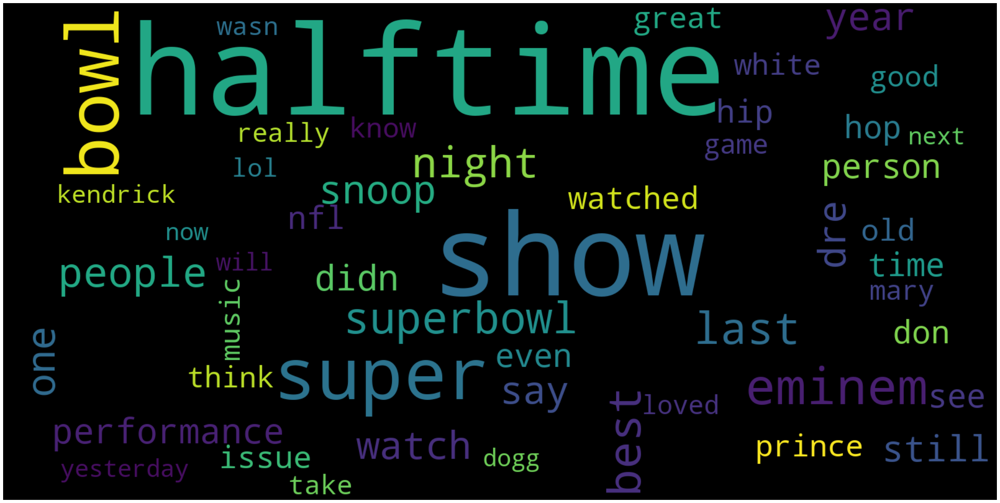

In [47]:
wordcloud = WordCloud(width=1600, stopwords=stopwords,height=800,max_font_size=200,max_words=50,collocations=False, background_color='black').generate(string)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()